In [2]:
!wget -c https://uni-bonn.sciebo.de/s/f81JqGZmEHXxMnB/download?path=%2F&files=steinmetz_2016-12-14_Cori.nc

--2023-10-24 08:49:30--  https://uni-bonn.sciebo.de/s/f81JqGZmEHXxMnB/download?path=%2F
Resolving uni-bonn.sciebo.de (uni-bonn.sciebo.de)... 128.176.1.2
Connecting to uni-bonn.sciebo.de (uni-bonn.sciebo.de)|128.176.1.2|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/zip]
Saving to: ‘download?path=%2F’

download?path=%2F       [            <=>     ]   1.16G  29.8MB/s    in 41s     

2023-10-24 08:50:12 (28.8 MB/s) - ‘download?path=%2F’ saved [1241807443]



In [ ]:
!wget --help

In [3]:
!unzip /content/download?path=%2F

Archive:  /content/download?path=%2F
   creating: steinmetz_neuromatch_dataset/
 extracting: steinmetz_neuromatch_dataset/steinmetz_2016-12-14_Cori.nc  
 extracting: steinmetz_neuromatch_dataset/steinmetz_2016-12-17_Cori.nc  
 extracting: steinmetz_neuromatch_dataset/steinmetz_2016-12-18_Cori.nc  
 extracting: steinmetz_neuromatch_dataset/steinmetz_2017-01-07_Muller.nc  
 extracting: steinmetz_neuromatch_dataset/steinmetz_2017-01-08_Muller.nc  
 extracting: steinmetz_neuromatch_dataset/steinmetz_2017-01-08_Radnitz.nc  
 extracting: steinmetz_neuromatch_dataset/steinmetz_2017-01-09_Muller.nc  
 extracting: steinmetz_neuromatch_dataset/steinmetz_2017-01-09_Radnitz.nc  
 extracting: steinmetz_neuromatch_dataset/steinmetz_2017-01-10_Radnitz.nc  
 extracting: steinmetz_neuromatch_dataset/steinmetz_2017-01-11_Radnitz.nc  
 extracting: steinmetz_neuromatch_dataset/steinmetz_2017-01-12_Radnitz.nc  
 extracting: steinmetz_neuromatch_dataset/steinmetz_2017-05-15_Moniz.nc  
 extracting: steinmetz

In [ ]:
import xarray as xa

In [4]:
dataset = xa.load_dataset('/content/steinmetz_neuromatch_dataset/steinmetz_2016-12-14_Cori.nc')

In [5]:
dataset

<xarray.Dataset>
Dimensions:             (trial: 364, time: 250, cell: 734,
                         waveform_component: 3, sample: 82, probe: 384,
                         brain_area_lfp: 7, spike_id: 2446173)
Coordinates:
  * trial               (trial) int32 1 2 3 4 5 6 7 ... 359 360 361 362 363 364
  * time                (time) float64 0.01 0.02 0.03 0.04 ... 2.48 2.49 2.5
  * cell                (cell) int32 1 2 3 4 5 6 7 ... 729 730 731 732 733 734
  * waveform_component  (waveform_component) int32 1 2 3
  * probe               (probe) int32 1 2 3 4 5 6 7 ... 379 380 381 382 383 384
  * brain_area_lfp      (brain_area_lfp) object 'ACA' 'LS' ... 'SUB' 'VISp'
  * spike_id            (spike_id) int32 1 2 3 4 ... 2446171 2446172 2446173
Dimensions without coordinates: sample
Data variables: (12/31)
    contrast_left       (trial) int8 100 0 100 0 50 0 0 ... 0 100 50 50 0 25 100
    contrast_right      (trial) int8 0 50 50 0 100 0 0 ... 25 100 25 25 50 0 100
    gocue               (trial) float64 1.027 0.8744 0.8252 ... nan nan nan
    stim_onset          (trial) float64 0.5 0.5 0.5 0.5 0.5 ... 0.5 0.5 0.5 0.5
    feedback_type       (trial) float64 1.0 1.0 1.0 1.0 -1.0 ... nan nan nan nan
    feedback_time       (trial) float64 1.187 1.438 0.986 2.296 ... nan nan nan
    ...                  ...
    waveform_w          (cell, sample, waveform_component) float32 0.0 ... -0...
    waveform_u          (cell, waveform_component, probe) float32 0.0 ... 0.0
    lfp                 (brain_area_lfp, trial, time) float64 -2.851 ... 5.571
    spike_time          (spike_id) float32 0.2676 2.308 0.8535 ... 2.189 2.399
    spike_cell          (spike_id) uint32 1 1 1 1 1 1 ... 734 734 734 734 734
    spike_trial         (spike_id) uint32 21 21 31 37 43 ... 364 364 364 364 364
Attributes:
    session_date:  2016-12-14
    mouse:         Cori
    stim_onset:    0.5
    bin_size:      0.01

In [6]:
dataset.wheel.values

array([[-1,  0,  0, ...,  1,  0,  1],
       [ 0, -1,  0, ...,  1,  0,  0],
       [ 0,  0, -1, ..., -1,  0,  0],
       ...,
       [ 0,  0,  0, ...,  0,  0,  0],
       [ 0,  0,  0, ...,  0,  0,  0],
       [ 0,  0,  0, ...,  0,  0,  0]], dtype=int8)

In [7]:
dataset.wheel.to_dataframe()

wheel
trial time       
1     0.01     -1
      0.02      0
      0.03      0
      0.04      0
      0.05      0
...           ...
364   2.46      0
      2.47      0
      2.48      0
      2.49      0
      2.50      0

[91000 rows x 1 columns]

In [8]:
wheel_data = dataset.wheel.to_dataframe().reset_index()
wheel_data

,trial,time,wheel
0,1,0.01,-1
1,1,0.02,0
2,1,0.03,0
3,1,0.04,0
4,1,0.05,0
...,...,...,...
90995,364,2.46,0
90996,364,2.47,0
90997,364,2.48,0
90998,364,2.49,0


In [9]:
import seaborn as sns

<Axes: xlabel='time', ylabel='wheel'>

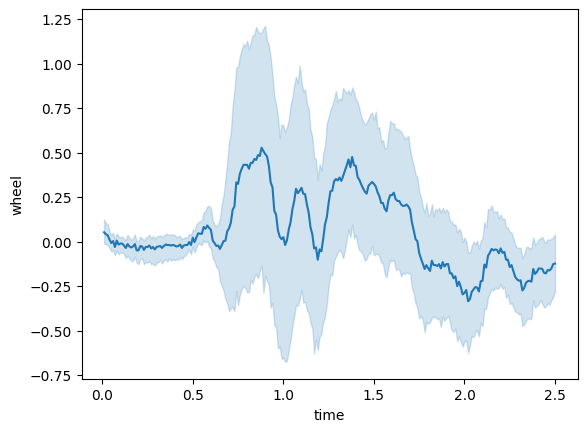

In [10]:
sns.lineplot(x=wheel_data.time, y=wheel_data.wheel)

### Day 2

In [22]:
x = dataset[['pupil_x','pupil_y','pupil_area']].to_dataframe()

In [28]:
from matplotlib import pyplot as plt

In [ ]:
!pip install --upgrade plotly

In [ ]:
!pip install jupyter-dash

In [39]:
x

pupil_x   pupil_y  pupil_area
trial time                                
1     0.01  0.812856  0.664247    0.165841
      0.02  0.778162  0.612752    0.158668
      0.03  0.812352  0.632769    0.169667
      0.04  0.760796  0.779100    0.172513
      0.05  0.790401  0.680980    0.176774
...              ...       ...         ...
364   2.46 -0.446190  0.230169    0.117658
      2.47 -0.472352  0.359197    0.120560
      2.48 -0.453607  0.130451    0.113835
      2.49 -0.486026  0.239184    0.109935
      2.50 -0.491644  0.270002    0.119929

[91000 rows x 3 columns]

In [40]:
import plotly.express as px

fig = px.scatter_3d(x, x='pupil_x', y='pupil_y', z='pupil_area')
fig.show()

In [42]:
x1 = x.reset_index()

In [45]:
fig = px.scatter_3d(x1, x='pupil_x', y='pupil_y', z='pupil_area',color='trial')
fig.show()

In [46]:
fig = px.scatter(x1, x='pupil_x', y='pupil_y',color='trial')
fig.show()